# 1. Data Loading and Raw data basic Information

In [31]:
import mne
import os
%matplotlib qt
import numpy as np
%ls

 Volume in drive C is Windows
 Volume Serial Number is BA9E-E287

 Directory of C:\Users\ShomoitaJahid.Mitin\Mitin

01/26/2024  11:50 AM    <DIR>          .
01/26/2024  11:50 AM    <DIR>          ..
01/26/2024  11:50 AM    <DIR>          .ipynb_checkpoints
01/23/2024  01:21 PM       317,953,082 1-23-24.ipynb
01/23/2024  06:54 PM        52,921,404 1-23-24-multiple.ipynb
01/23/2024  01:56 PM       317,962,048 1-23-24-singleData.ipynb
01/26/2024  10:26 AM       146,047,666 1-25-24.ipynb
01/26/2024  10:23 AM       228,278,560 1-25-24-Copy1.ipynb
10/18/2023  11:51 AM       143,150,762 17OCT.ipynb
09/26/2023  03:47 PM            10,971 20_reading_eeg_data.ipynb
10/02/2023  09:58 AM        33,881,400 Control1001.eeg
10/02/2023  09:58 AM            14,272 Control1001.vhdr
10/02/2023  09:58 AM               470 Control1001.vmrk
01/24/2024  10:29 AM        26,568,360 Control1021.eeg
01/24/2024  10:29 AM            14,272 Control1021.vhdr
01/24/2024  10:29 AM               470 Control1021.vmrk
01

In [32]:
#reading the data
vhdr_file = 'Control1001.vhdr'
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)

Extracting parameters from Control1001.vhdr...
Setting channel info structure...
Reading 0 ... 134449  =      0.000 ...   268.898 secs...


C:\Users\ShomoitaJahid.Mitin\AppData\Local\Temp\ipykernel_50556\1373165507.py:3: RuntimeWarning: Online software filter detected. Using software filter settings and ignoring hardware values
  raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)


In [33]:
#data information
print(raw.info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, TP9, CP5, CP1, P3, P7, ...
 chs: 63 EEG
 custom_ref_applied: False
 dig: 66 items (3 Cardinal, 63 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: 2017-11-14 13:26:21 UTC
 nchan: 63
 projs: []
 sfreq: 500.0 Hz
>


# 2. Raw EEG Data Ploting

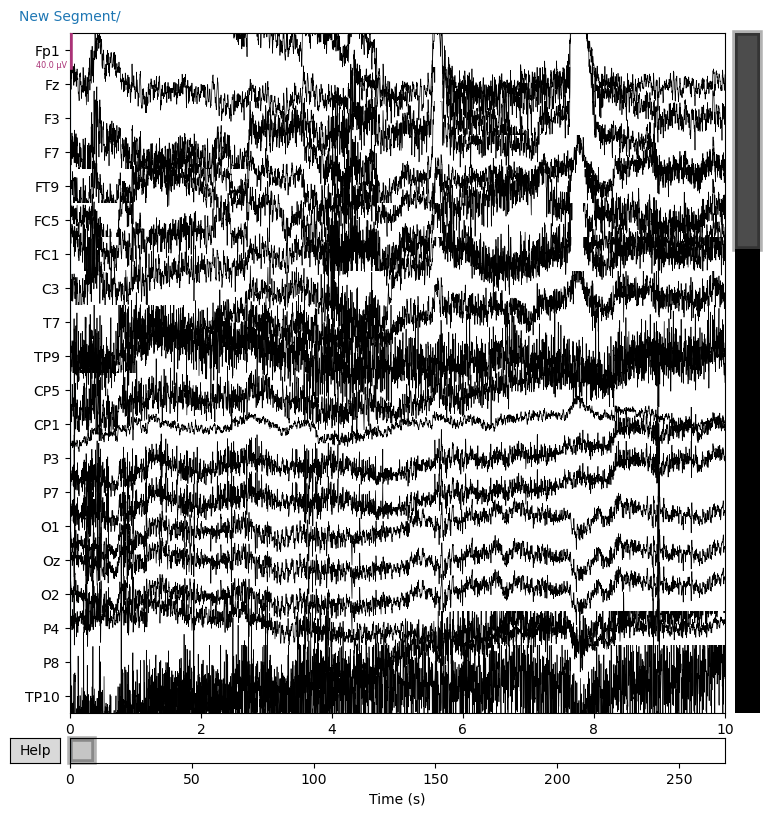

In [34]:
raw.plot()

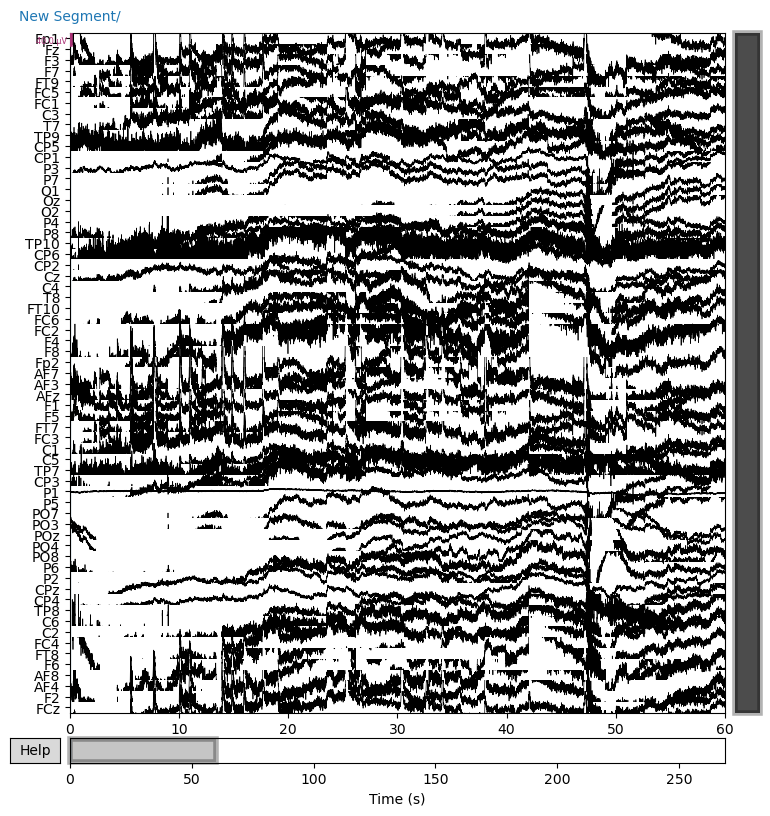

In [35]:
# Picking EEG channels
eeg_channels = mne.pick_types(raw.info, eeg=True)

# Plotting the raw EEG data
raw.plot(duration=60, n_channels=len(eeg_channels), order=eeg_channels, remove_dc=False)

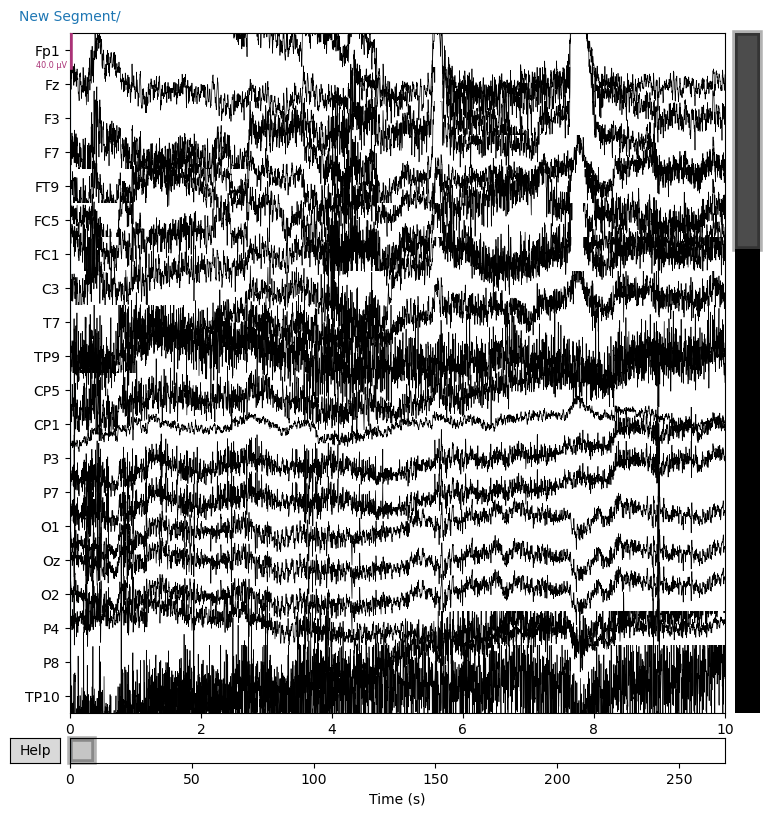

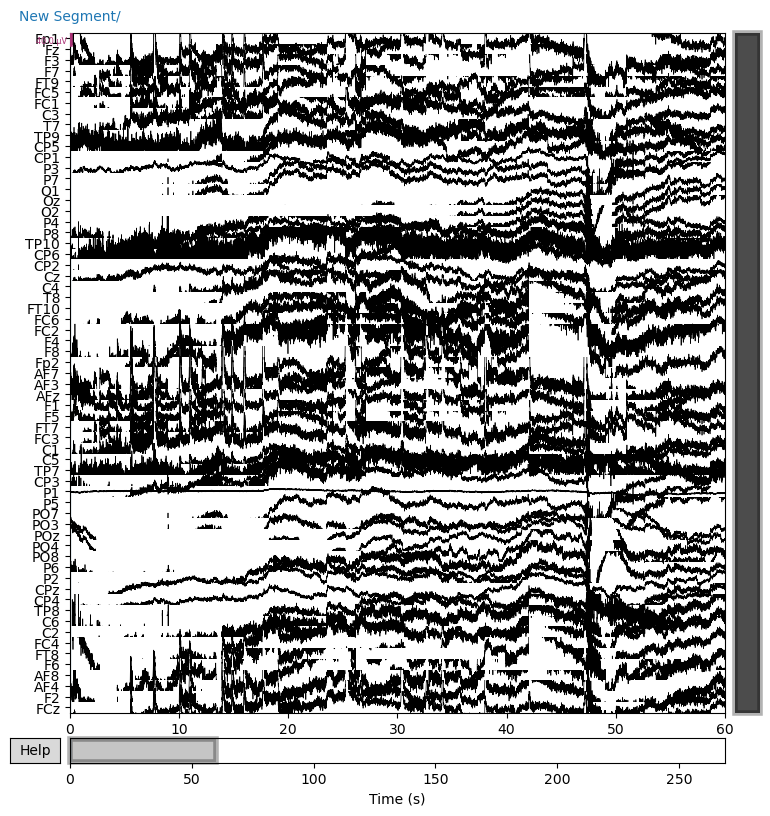

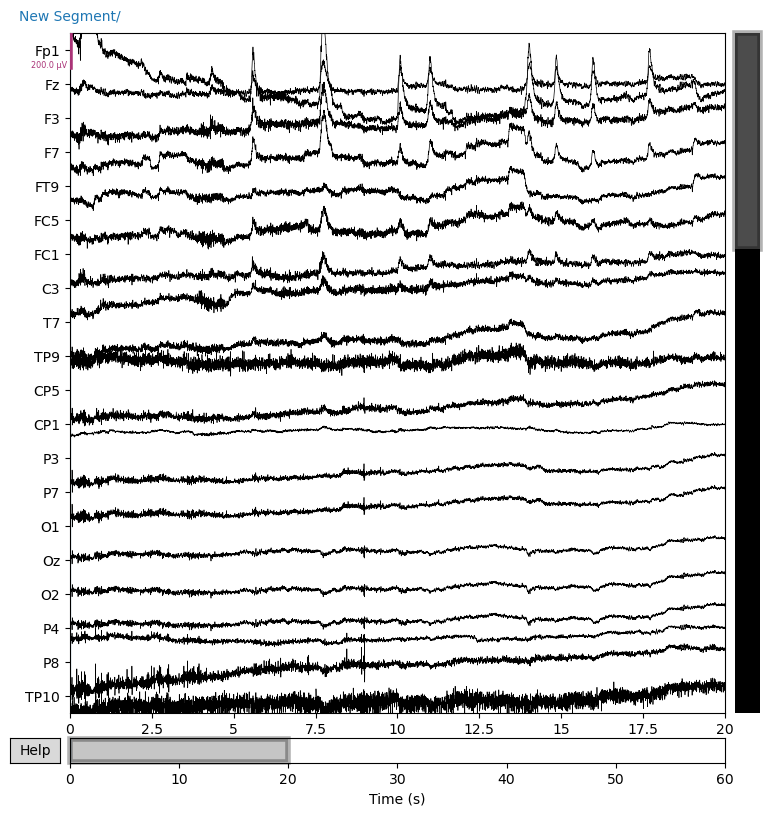

Channels marked as bad:
none
Channels marked as bad:
none


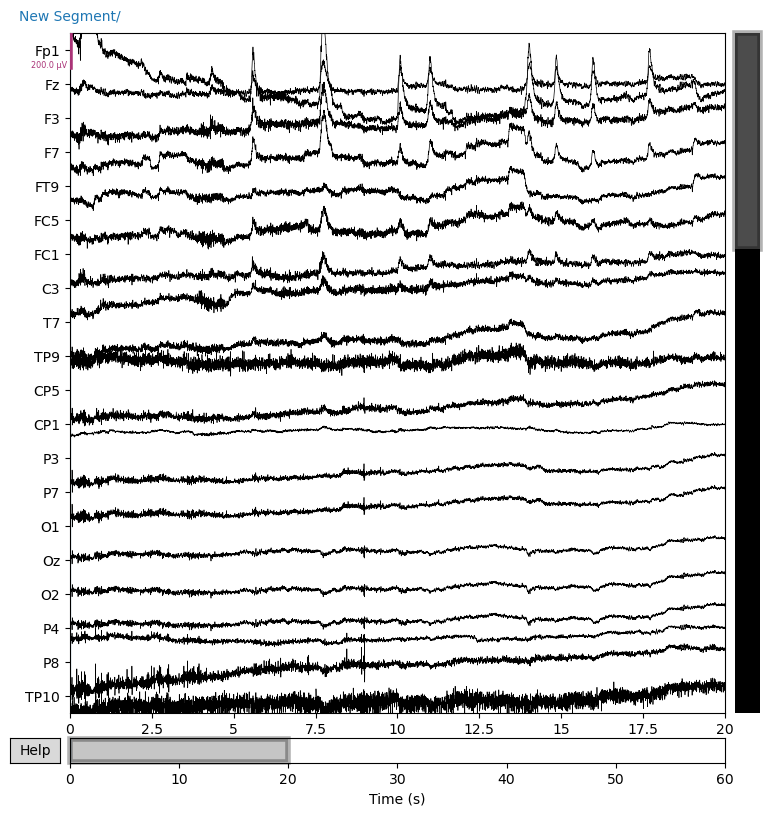

In [36]:
%matplotlib inline
#cropping
scaling_factor= 100e-6
raw=raw.crop(0, 60).load_data()
raw.plot( duration = 20, scalings= scaling_factor,order=eeg_channels, remove_dc=False)

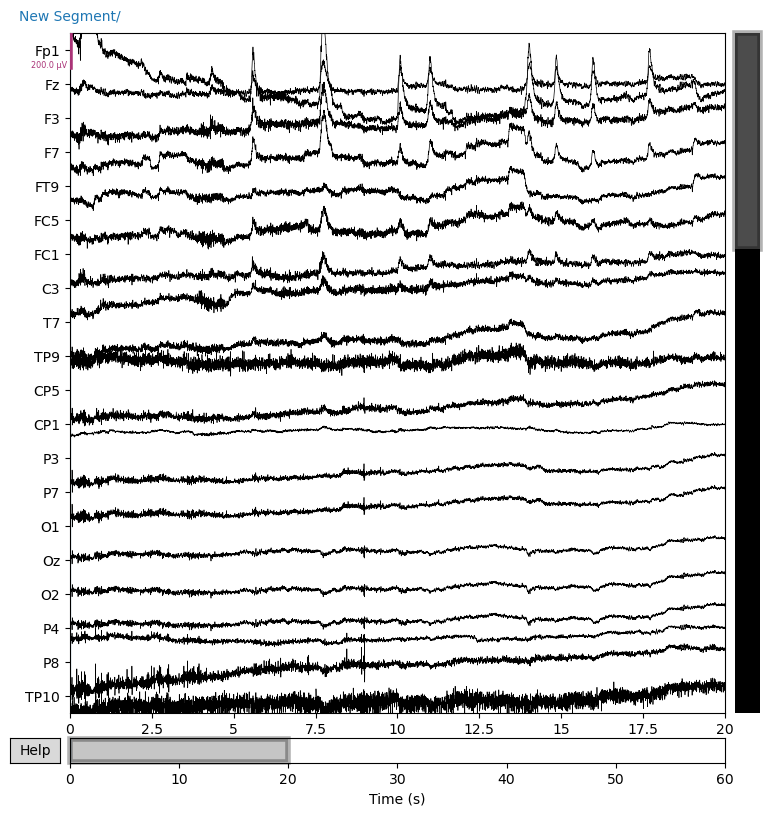

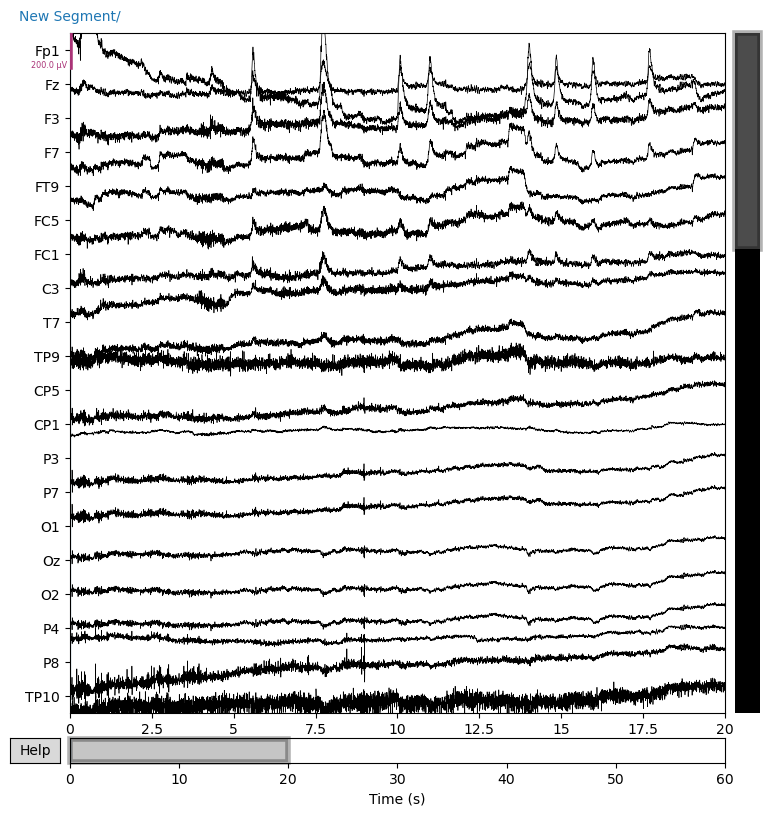

In [37]:
raw.plot(scalings= scaling_factor, duration=20, order=eeg_channels, remove_dc=False)

# 3. Pre-Proceesing and Data Cleaning

## 3.1 Low-Pass Filtering

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.0s finished


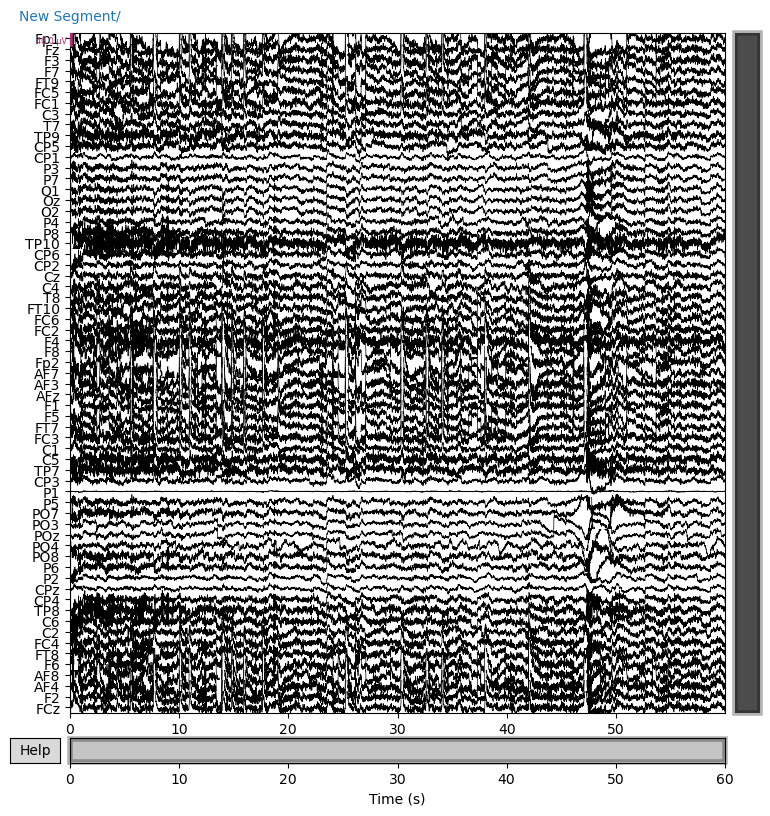

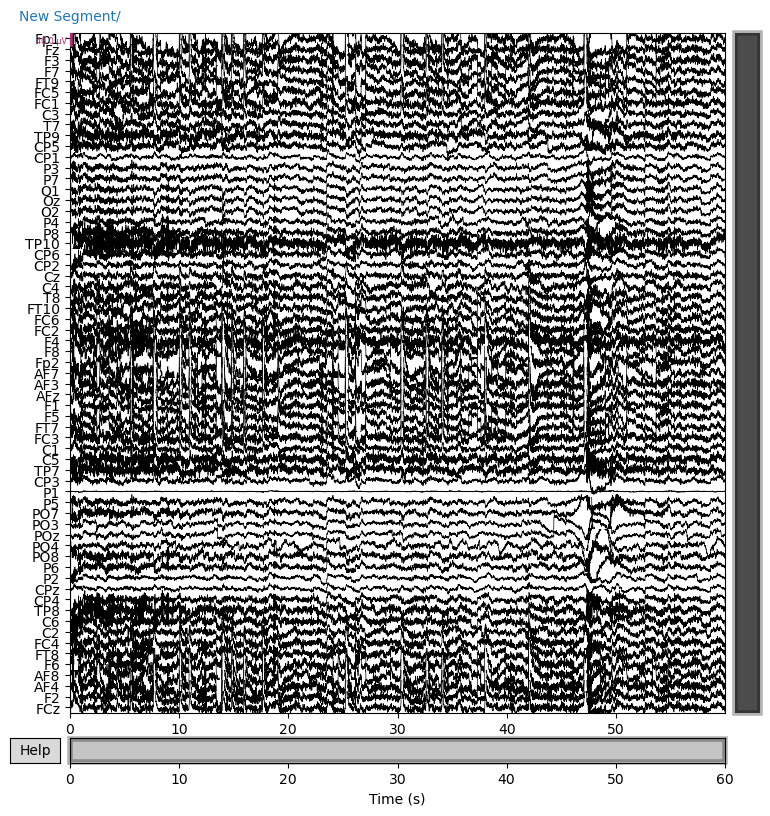

In [38]:
#preprocessing begins 
# filtering parameters
l_freq = 0.5  
h_freq = 50 
new_sfreq = 100 


raw.filter(l_freq, h_freq)
raw.resample(new_sfreq, npad="auto")


#raw.plot()
raw.plot(duration=60, n_channels=len(eeg_channels), order=eeg_channels, remove_dc=False)

After Band Pass filtering and Downsampling


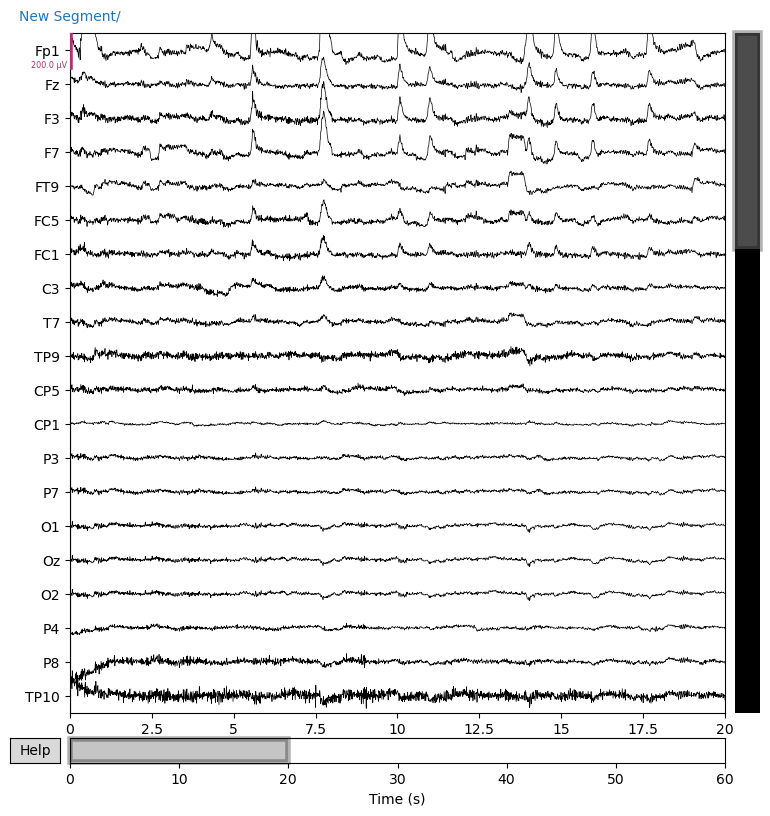

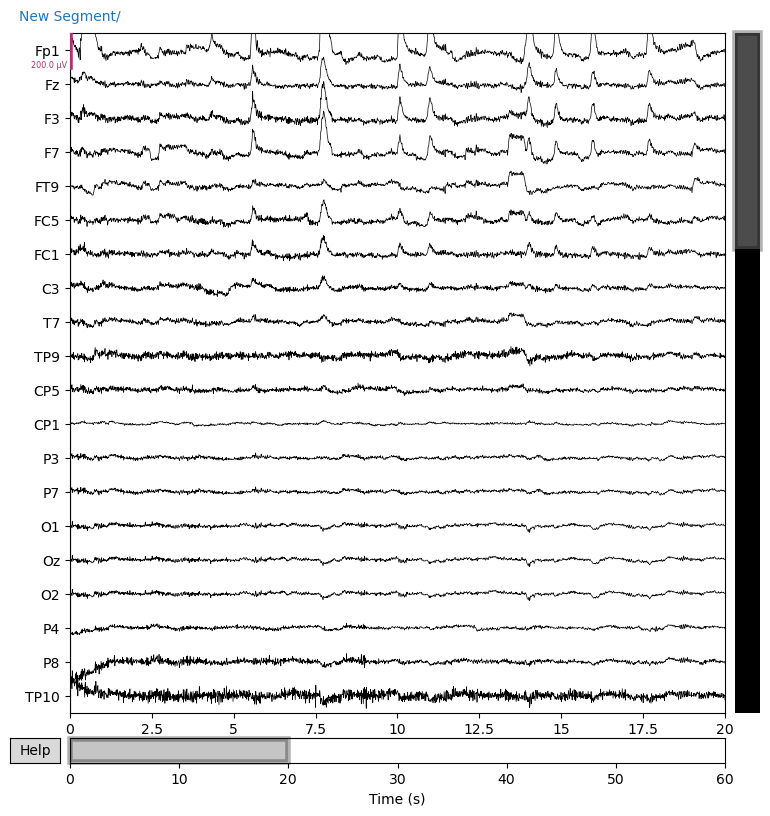

In [39]:
print("After Band Pass filtering and Downsampling")
raw.plot(scalings= scaling_factor, duration = 20,  order=eeg_channels, remove_dc=False)

## 3.2 Signal Projectors deletion

In [40]:
#deleting signal projectors for analysis
ssp_projectors = raw.info["projs"]
raw.del_proj()

<RawBrainVision | Control1001.eeg, 63 x 6000 (60.0 s), ~3.0 MB, data loaded>

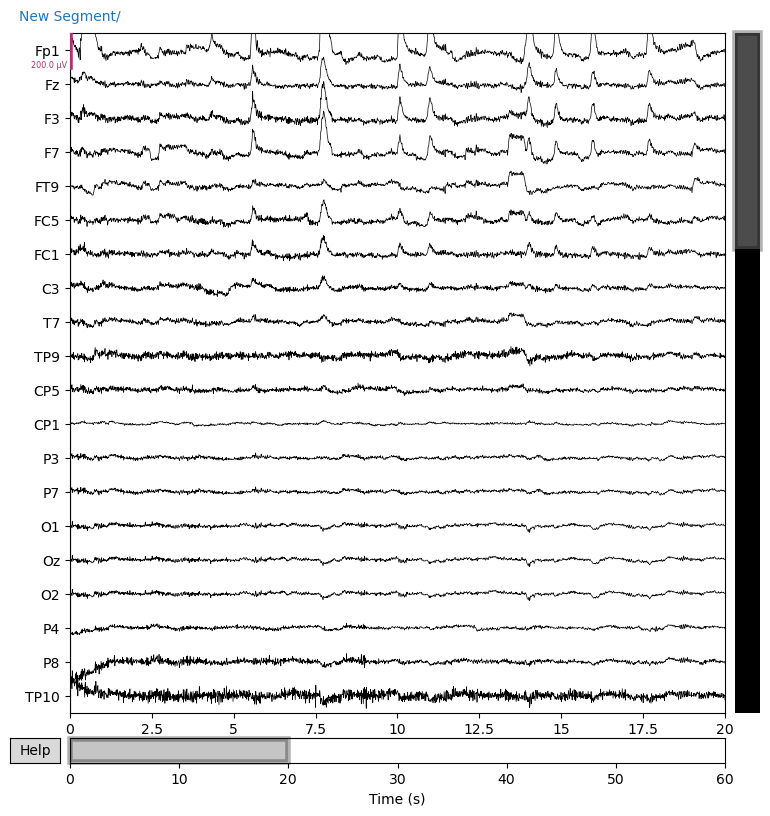

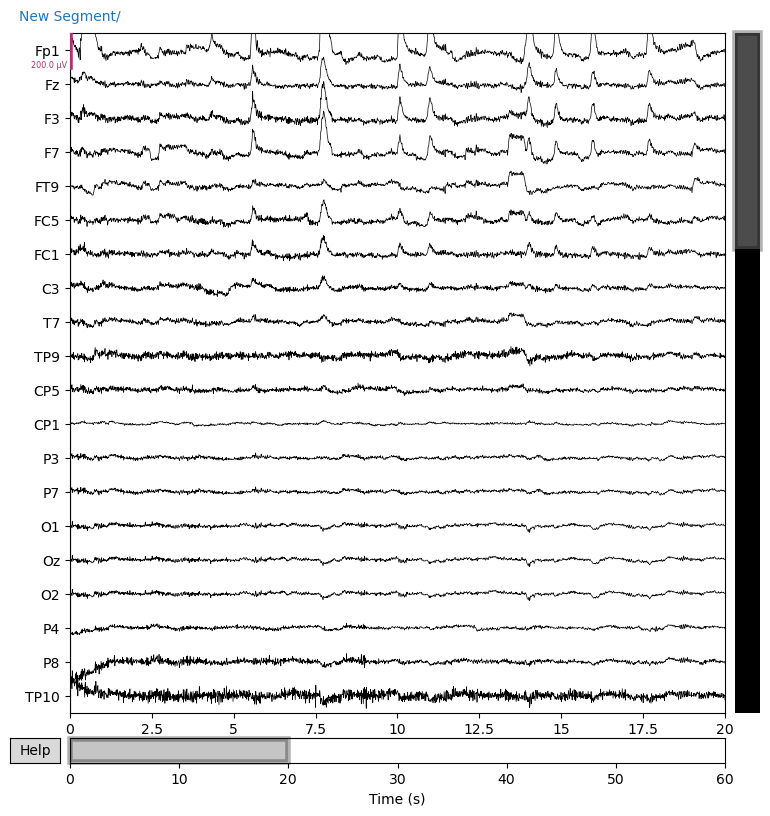

In [41]:
raw.plot(scalings= scaling_factor, duration=20, order=eeg_channels, remove_dc=False)

In [42]:
print(raw.ch_names)



['Fp1', 'Fz', 'F3', 'F7', 'FT9', 'FC5', 'FC1', 'C3', 'T7', 'TP9', 'CP5', 'CP1', 'P3', 'P7', 'O1', 'Oz', 'O2', 'P4', 'P8', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'T8', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2', 'AF7', 'AF3', 'AFz', 'F1', 'F5', 'FT7', 'FC3', 'C1', 'C5', 'TP7', 'CP3', 'P1', 'P5', 'PO7', 'PO3', 'POz', 'PO4', 'PO8', 'P6', 'P2', 'CPz', 'CP4', 'TP8', 'C6', 'C2', 'FC4', 'FT8', 'F6', 'AF8', 'AF4', 'F2', 'FCz']


## 3.3 ICA component Removal

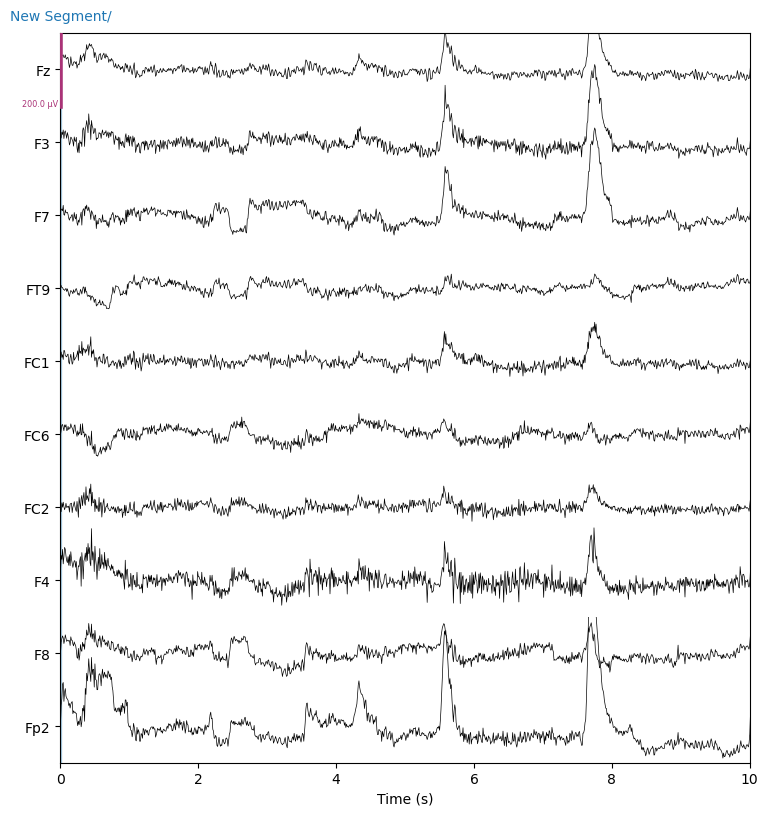

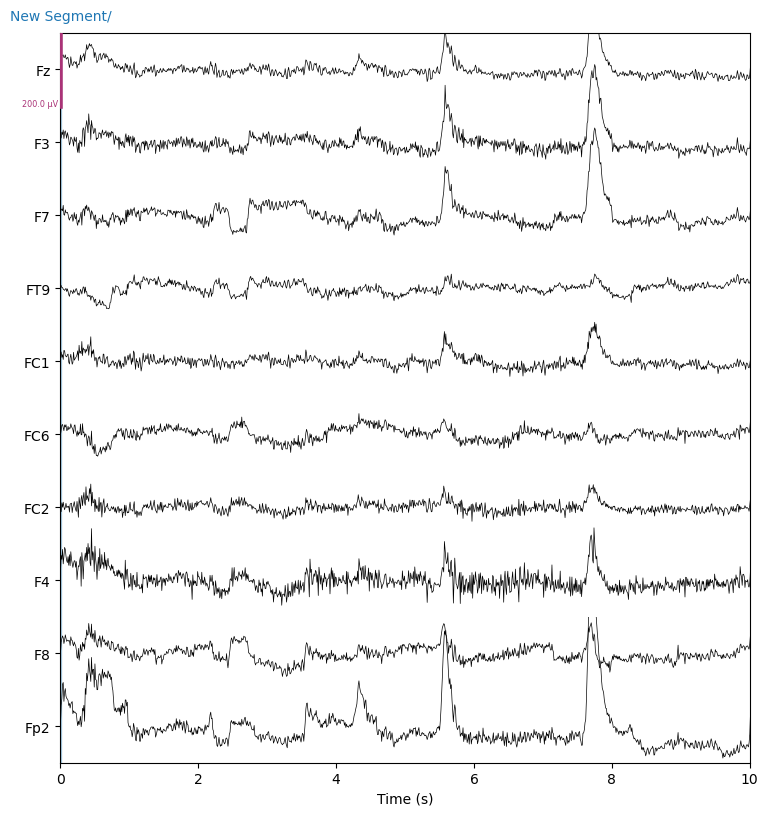

In [43]:
regexp = r"(Fz|F3|F7|FT9|FC1|FC6|FC2|F4|F8|Fp2)"
artifact_picks = mne.pick_channels_regexp(raw.ch_names, regexp=regexp)
raw.plot(scalings = scaling_factor, order=artifact_picks, n_channels=len(artifact_picks), show_scrollbars=False)

Channels with EYE Movement Artifacts


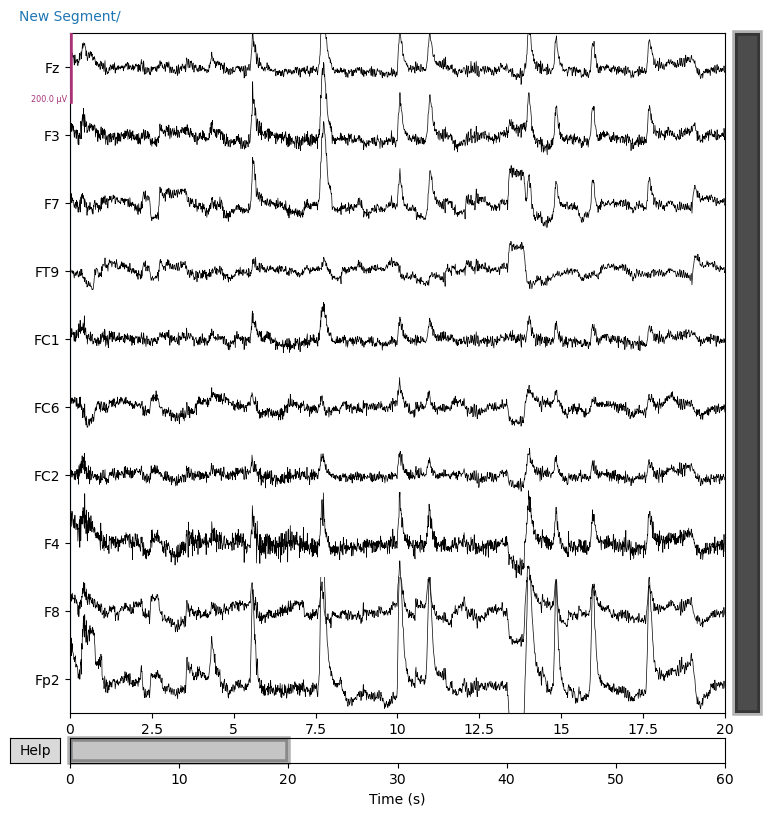

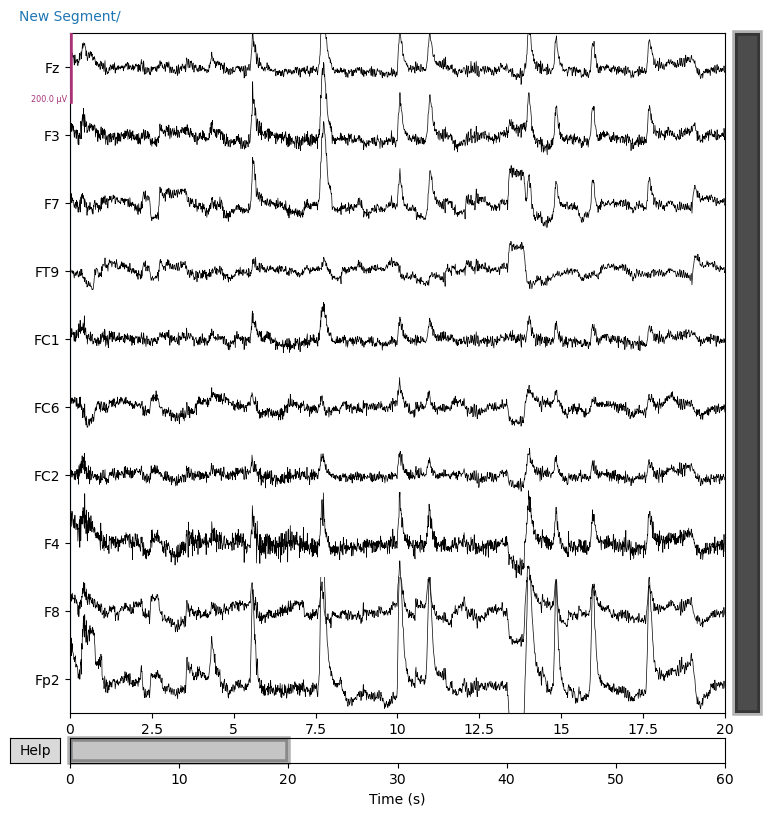

In [44]:
#raw.plot(order=artifact_picks, n_channels=len(artifact_picks), show_scrollbars=False)
print("Channels with EYE Movement Artifacts")
raw.plot(scalings= scaling_factor, duration=20, order=artifact_picks, remove_dc=False)

In [45]:
filt_raw = raw.copy().filter(l_freq=1.0, h_freq=None)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 331 samples (3.310 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    0.0s finished


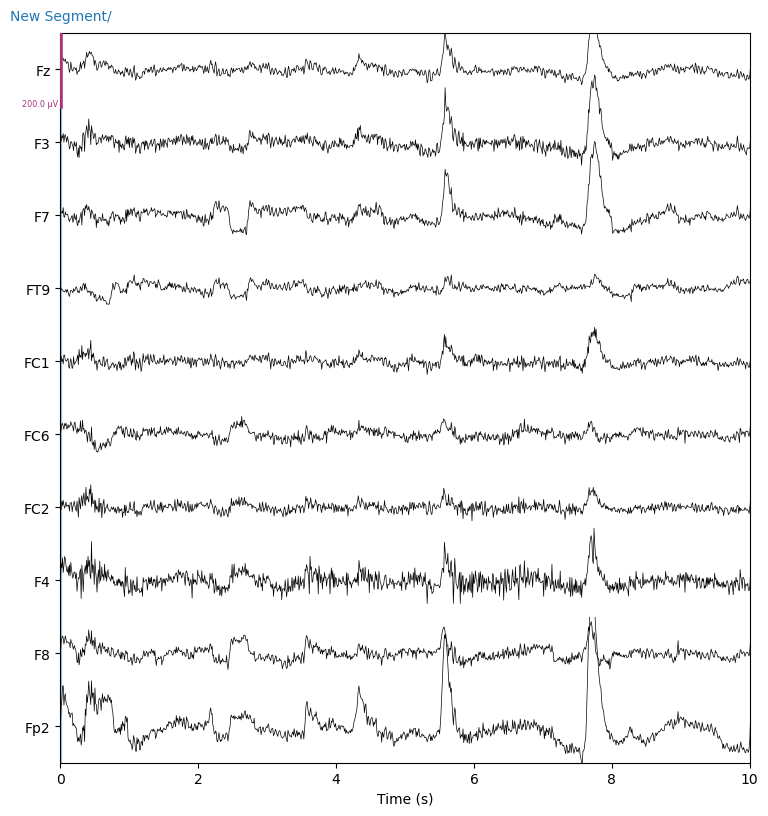

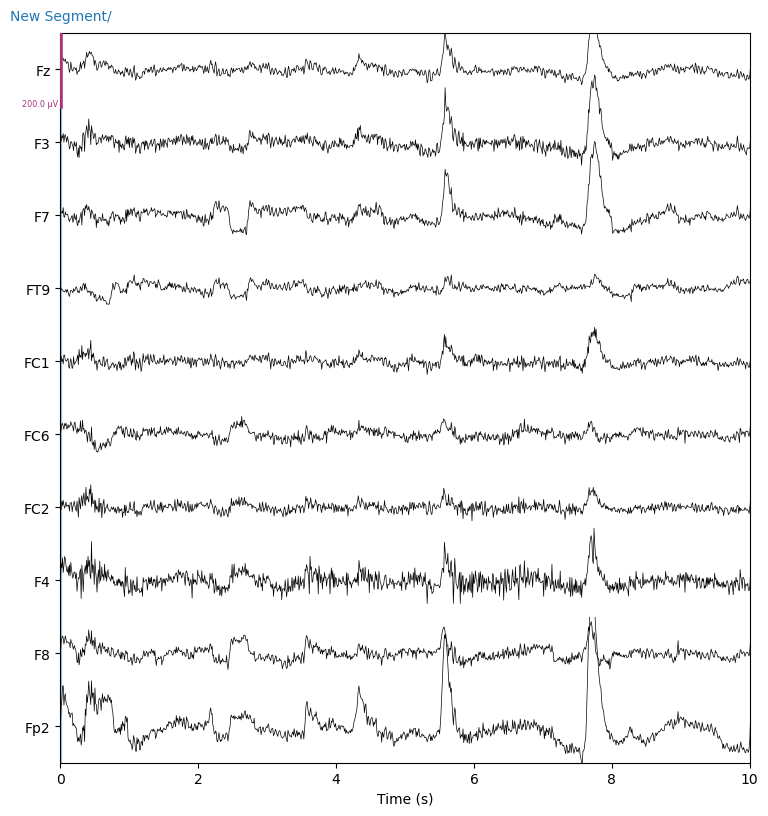

In [46]:
filt_raw.plot(scalings= scaling_factor, order=artifact_picks, n_channels=len(artifact_picks), show_scrollbars=False)

## ICA Fitting

In [47]:
import mne
from mne.preprocessing import ICA

ica = ICA(n_components=63, max_iter='auto', random_state=97)
fitted_ica = ica.fit(filt_raw)

Fitting ICA to data using 63 channels (please be patient, this may take a while)
Selecting by number: 63 components
Fitting ICA took 3.4s.


Creating RawArray with float64 data, n_channels=63, n_times=6000
    Range : 0 ... 5999 =      0.000 ...    59.990 secs
Ready.


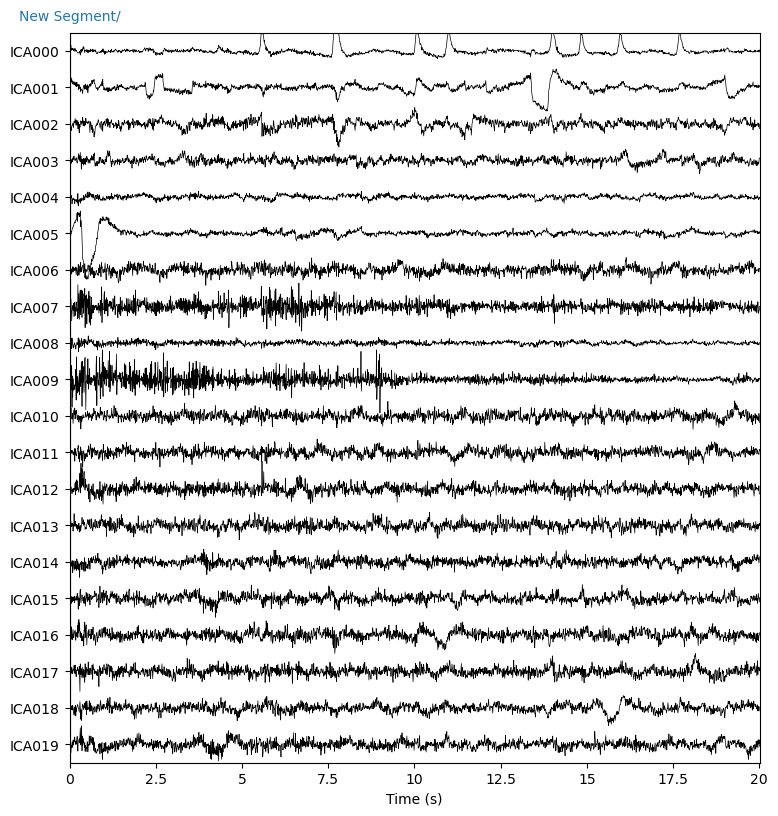

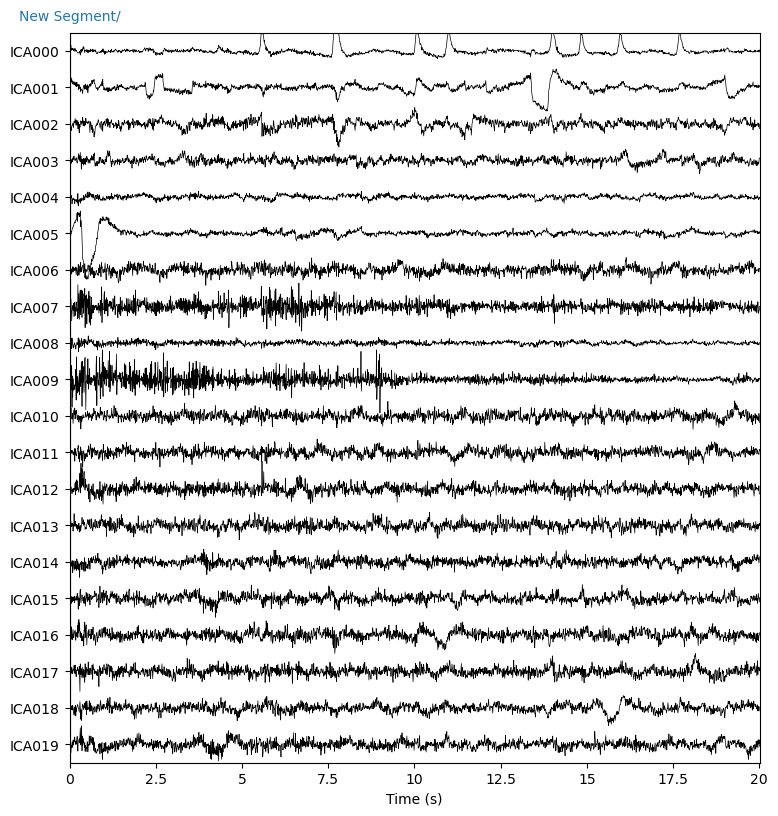

In [48]:
filt_raw.load_data()
ica.plot_sources(filt_raw, show_scrollbars=False)

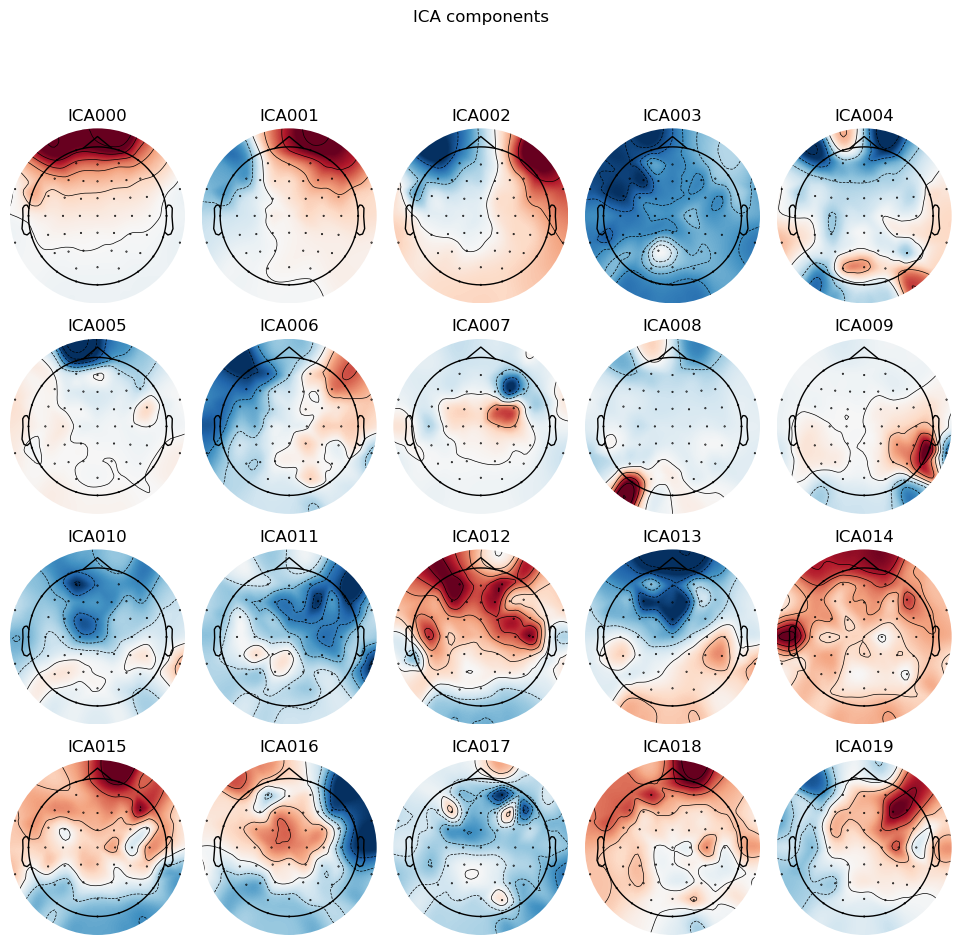

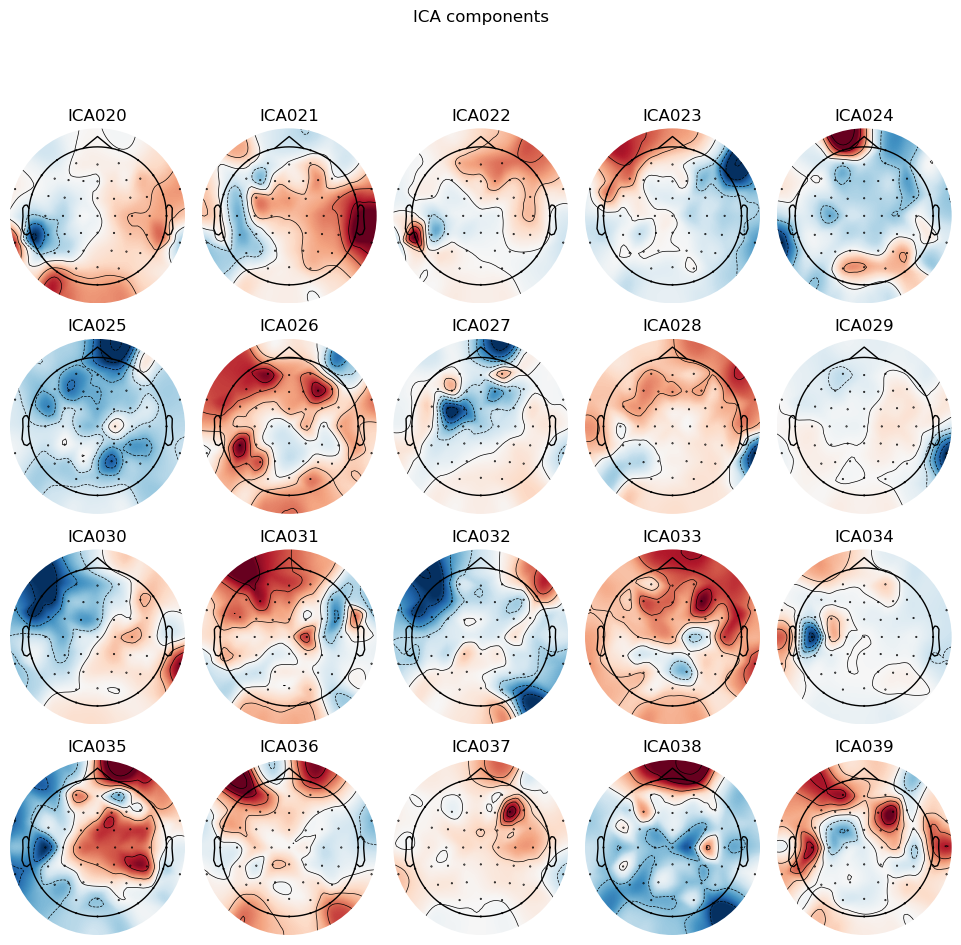

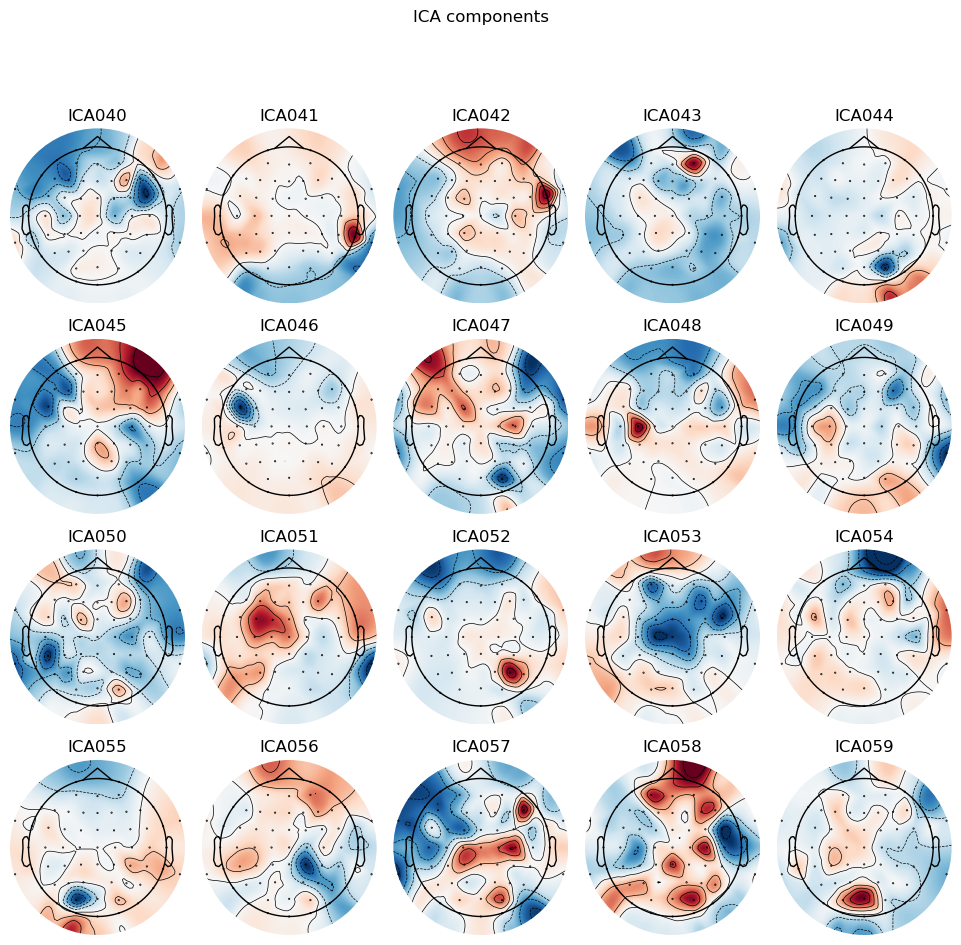

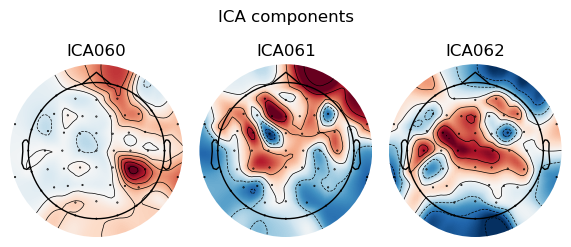

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 585x260.5 with 3 Axes>]

In [49]:
ica.plot_components()

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 1 ICA component
    Projecting back using 63 PCA components


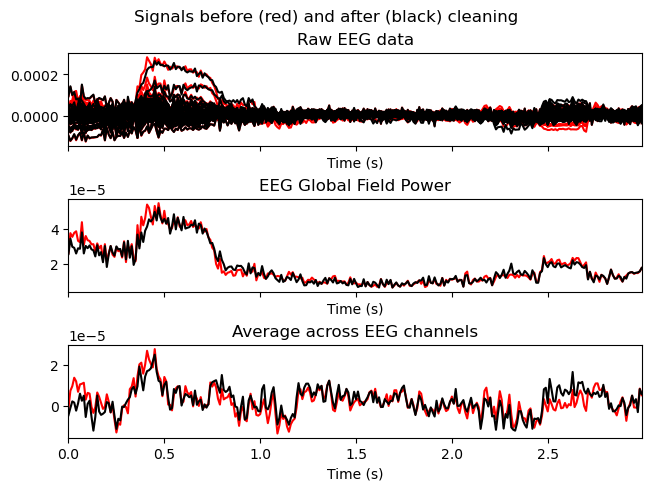

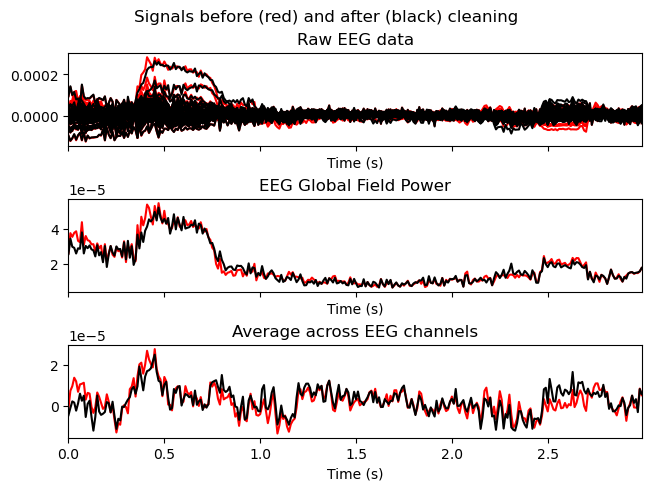

In [50]:
ica.plot_overlay(raw, exclude=[0], picks="eeg")

## ICA Exclusion

In [51]:
ica.exclude = [0]

Applying ICA to Raw instance
    Transforming to ICA space (63 components)
    Zeroing out 1 ICA component
    Projecting back using 63 PCA components
Filtered EEG Signal befor ICA


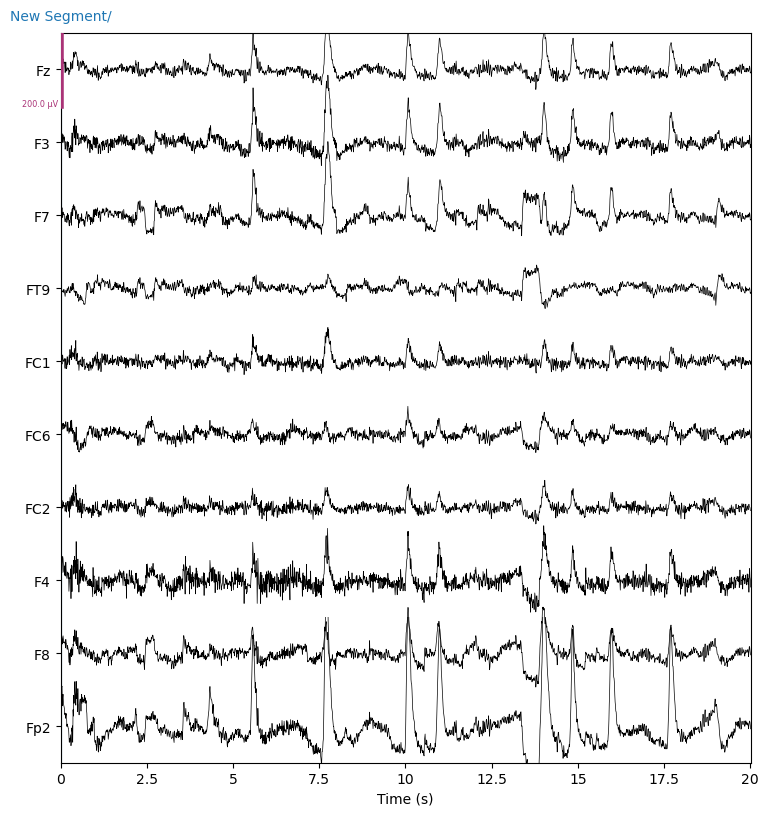

ICA Applied EEG Signal


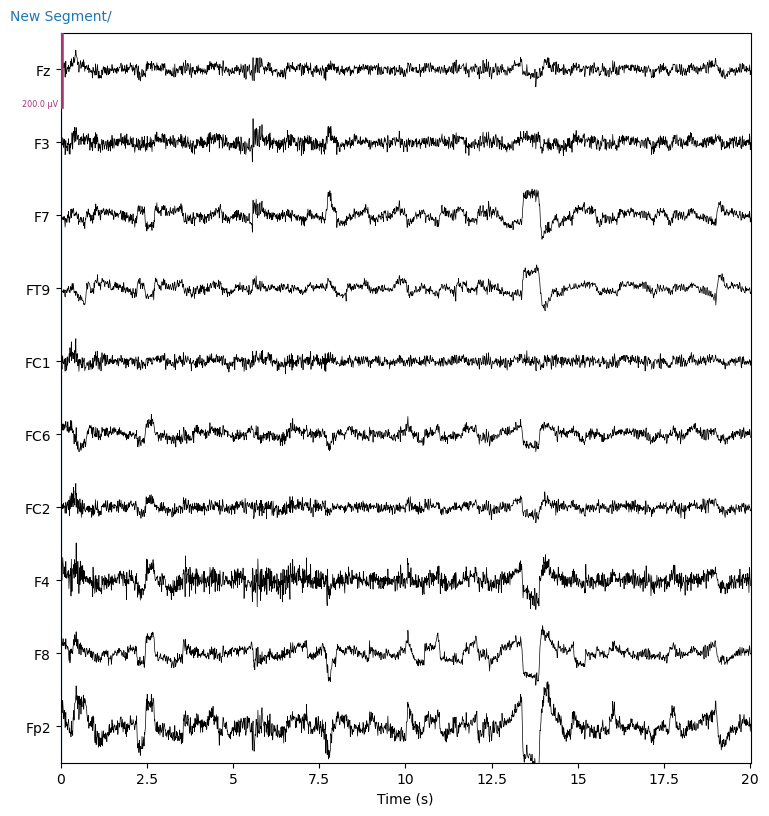

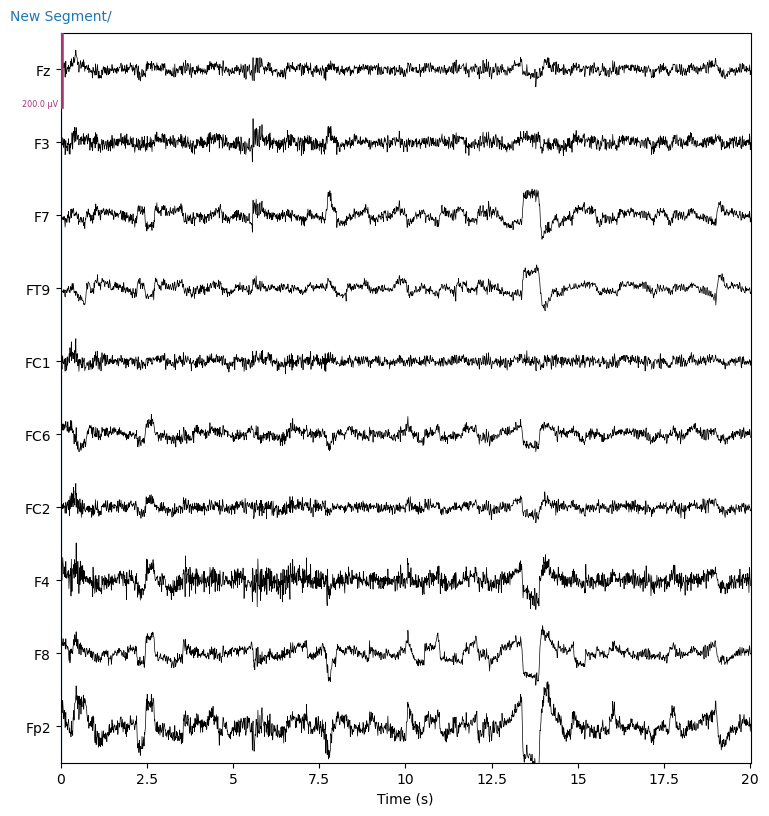

In [52]:
#%matplotlib inline
reconst_raw = filt_raw.copy()
ica.apply(reconst_raw)
print("Filtered EEG Signal befor ICA")
filt_raw.plot(duration = 20, scalings= scaling_factor,order=artifact_picks,  show_scrollbars=False)
print("ICA Applied EEG Signal")
reconst_raw.plot(duration = 20, scalings= scaling_factor, order=artifact_picks, show_scrollbars=False)

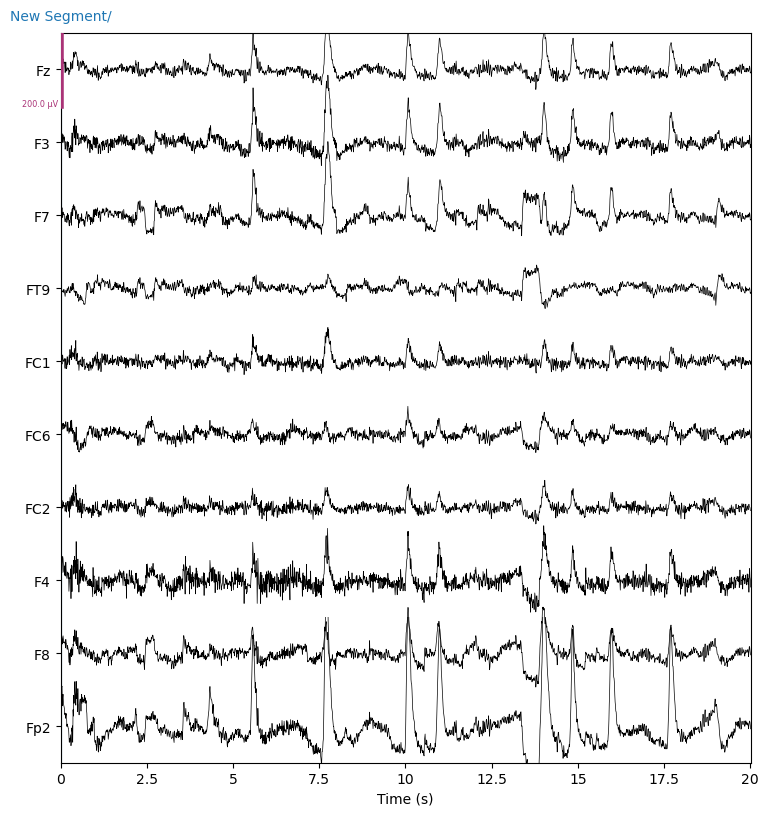

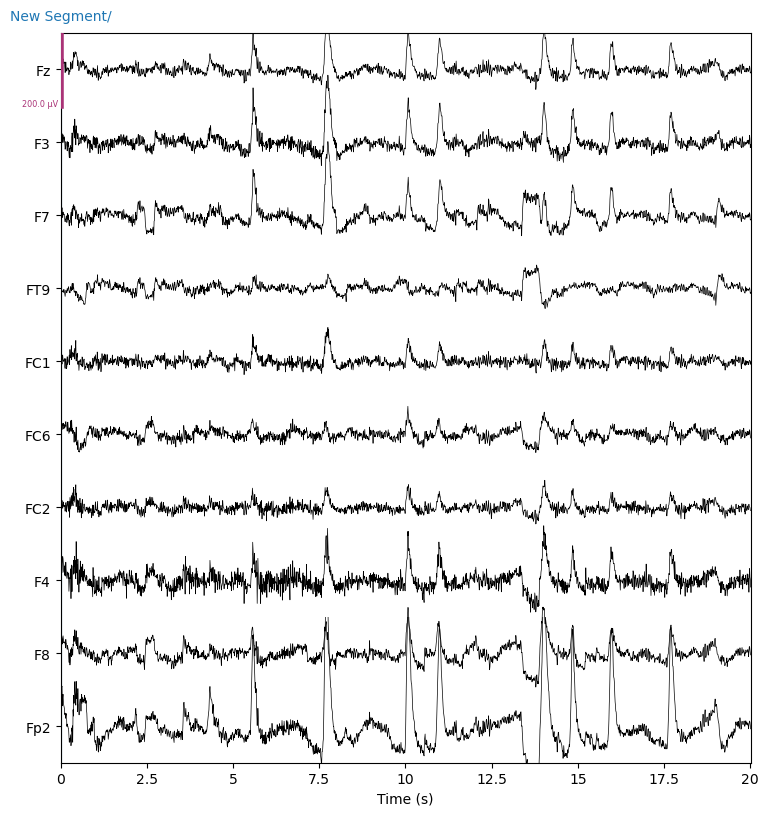

In [53]:
filt_raw.plot(duration = 20, scalings= scaling_factor,order=artifact_picks,  show_scrollbars=False)

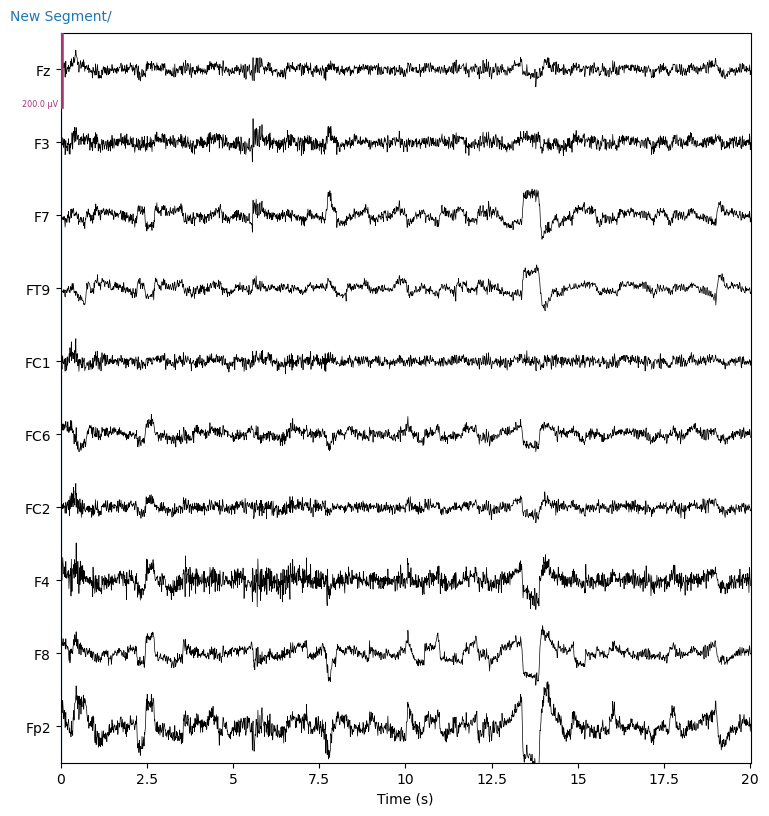

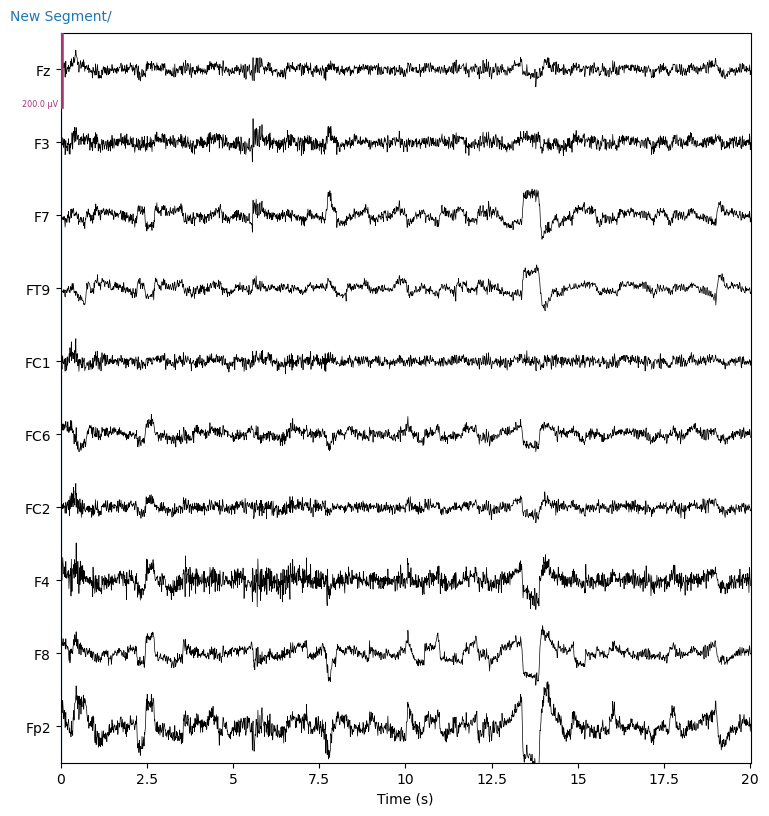

In [54]:
reconst_raw.plot(duration = 20, scalings= scaling_factor, order=artifact_picks, show_scrollbars=False)

### 4. Conclusion: Cleaning the artifacts from the signals takes a huge amount of time, that's why this code is a sample code for showing how to remove the artifacts from signals. In the main program, this process is not further used rather I have separtely ran this same ICA method to clean each of the signals in my dataset and saved the clean signals. For the main code, for trainig the models, directly clean signals are imported to minimize the cleaning time. Cleaning is separated and completed in the initial time.